In [1]:
# Post-Covid-19 Tourism Recovery：Opportunities and Challenges for the Airbnb Market

## CASA0013: Foundations of Spatial Data Science

### Student Ids: ucfnhed, zczlgon, zczl551, ucfnyyz.

In [37]:
%matplotlib inline

import math

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd

import statsmodels.formula.api as smf
import statsmodels

import seaborn as sn

import folium

In [38]:
# read in Inside Airbnb dataframe

df_2020 = pd.read_csv('https://raw.githubusercontent.com/yanqizeng/fsds_assessment/main/2020.csv',low_memory=False)
df_2022 = pd.read_csv('https://raw.githubusercontent.com/yanqizeng/fsds_assessment/main/2022.csv',low_memory=False)

In [39]:
# pick the columns that we need

df_2020_pick = df_2020.loc[:,['id', 'price', 'number_of_reviews_ltm','reviews_per_month']]
df_2022_pick = df_2022.loc[:,['id', 'room_type', 'price','longitude', 'latitude', 'minimum_nights',
                              'number_of_reviews_ltm', 'reviews_per_month']]

In [40]:
# rename the columns

df_2020_rename = df_2020_pick.rename(columns = {'price':'price_2020',
                                                'number_of_reviews_ltm':'number_of_reviews_ltm_2020',
                                                'reviews_per_month':'reviews_per_month_2020'})
df_2022_rename = df_2022_pick.rename(columns = {'price':'price_2022',
                                                'number_of_reviews_ltm':'number_of_reviews_ltm_2022',
                                                'reviews_per_month':'reviews_per_month_2022'})
print(df_2020_rename.columns)
print(df_2020_rename.dtypes)
print(df_2022_rename.columns)
print(df_2022_rename.dtypes)

Index(['id', 'price_2020', 'number_of_reviews_ltm_2020',
       'reviews_per_month_2020'],
      dtype='object')
id                            float64
price_2020                     object
number_of_reviews_ltm_2020     object
reviews_per_month_2020         object
dtype: object
Index(['id', 'room_type', 'price_2022', 'longitude', 'latitude',
       'minimum_nights', 'number_of_reviews_ltm_2022',
       'reviews_per_month_2022'],
      dtype='object')
id                            float64
room_type                      object
price_2022                      int64
longitude                     float64
latitude                      float64
minimum_nights                  int64
number_of_reviews_ltm_2022      int64
reviews_per_month_2022        float64
dtype: object


In [41]:
# join IA dataframes

df = pd.merge(df_2020_rename, df_2022_rename, how='inner', on=['id'])

In [42]:
#delete $ and change datatype

df['price_2020'] = df['price_2020'].mask(df['price_2020'].str.contains('\,')==True,df['price_2020'].str.replace(',',''))
df['price_2020'] = df['price_2020'].str.split('$').str[1]
df['price_2020'] = df['price_2020'].astype('float64')
df['price_2022'] = df['price_2022'].astype('float64')
df.dtypes

id                            float64
price_2020                    float64
number_of_reviews_ltm_2020     object
reviews_per_month_2020         object
room_type                      object
price_2022                    float64
longitude                     float64
latitude                      float64
minimum_nights                  int64
number_of_reviews_ltm_2022      int64
reviews_per_month_2022        float64
dtype: object

In [43]:
# IA data cleaning

df['reviews_per_month_2020'] = np.nan_to_num(df['reviews_per_month_2020'])
df['reviews_per_month_2022'] = np.nan_to_num(df['reviews_per_month_2022'])
df_cleaned = df[
    (df["number_of_reviews_ltm_2020"] != 0) & 
    (df["reviews_per_month_2020"] != 0) & 
    (df["number_of_reviews_ltm_2022"] != 0) & 
    (df["reviews_per_month_2022"] != 0) & 
    (df["minimum_nights"] <= 5)]

In [44]:
# add price increase percentage

df_cleaned.loc[:,'price_increase']=(df_cleaned.price_2022 - df_cleaned.price_2020)/df_cleaned.price_2020
df_cleaned.head()

/tmp/ipykernel_971/2124903547.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned.loc[:,'price_increase']=(df_cleaned.price_2022 - df_cleaned.price_2020)/df_cleaned.price_2020


,id,price_2020,number_of_reviews_ltm_2020,reviews_per_month_2020,room_type,price_2022,longitude,latitude,minimum_nights,number_of_reviews_ltm_2022,reviews_per_month_2022,price_increase
1,17402.0,208.0,1,0.37,Entire home/apt,307.0,-0.14094,51.52195,4,3,0.34,0.475962
4,33332.0,65.0,1,0.05,Private room,65.0,-0.32554,51.46416,2,6,0.09,0.000000
5,36299.0,195.0,4,0.64,Entire home/apt,195.0,-0.28086,51.48085,3,10,0.64,0.000000
6,36660.0,72.0,19,4.36,Private room,72.0,-0.16057,51.58478,2,22,3.93,0.000000
8,38605.0,58.0,22,3.06,Private room,62.0,-0.23345,51.50681,2,3,2.67,0.068966


In [45]:
# pick columns that we need

df_pick = df_cleaned.loc[:,['longitude', 'latitude', 'price_increase',
                            'reviews_per_month_2022', 'number_of_reviews_ltm_2022']]
df_pick=df_pick.reset_index(drop=True)
print(df_pick.head())
print(df_pick.dtypes)

   longitude  latitude  price_increase  reviews_per_month_2022  \
0   -0.14094  51.52195        0.475962                    0.34   
1   -0.32554  51.46416        0.000000                    0.09   
2   -0.28086  51.48085        0.000000                    0.64   
3   -0.16057  51.58478        0.000000                    3.93   
4   -0.23345  51.50681        0.068966                    2.67   

   number_of_reviews_ltm_2022  
0                           3  
1                           6  
2                          10  
3                          22  
4                           3  
longitude                     float64
latitude                      float64
price_increase                float64
reviews_per_month_2022        float64
number_of_reviews_ltm_2022      int64
dtype: object


In [46]:
# read in London sites dataframe

df_sites = pd.read_csv('https://raw.githubusercontent.com/yanqizeng/fsds_assessment/main/vva_site_listings_London_2021_02.csv')

In [47]:
# rename site columns

df_sites_rename = df_sites.rename(columns = {'Visitors 2021':'visitors_2021'})

In [48]:
# pick the columns that we need

df_sites_pick = df_sites_rename.loc[:,['Longitude','Latitude', 'visitors_2021']]
print(df_sites_pick.head())

   Longitude   Latitude visitors_2021
0  -0.295909  51.479362    1,963,171 
1  -0.176389  51.496111    1,571,413 
2  -0.126944  51.519444    1,327,120 
3  -0.099400  51.507600    1,156,037 
4  -0.117194  51.511028      984,978 


In [49]:
# change datatypes

df_sites_pick['visitors_2021'] = df_sites_pick['visitors_2021'].str.replace('$','', regex=True).replace(',','', regex=True).astype('float64')

In [50]:
# add index number for merging

df_pick.insert(0, 'house_index', range(0, len(df_pick)))
df_sites_pick.insert(0, 'site_index', range(0, len(df_sites_pick)))
print(df_pick.head())
print(df_sites_pick.head())

   house_index  longitude  latitude  price_increase  reviews_per_month_2022  \
0            0   -0.14094  51.52195        0.475962                    0.34   
1            1   -0.32554  51.46416        0.000000                    0.09   
2            2   -0.28086  51.48085        0.000000                    0.64   
3            3   -0.16057  51.58478        0.000000                    3.93   
4            4   -0.23345  51.50681        0.068966                    2.67   

   number_of_reviews_ltm_2022  
0                           3  
1                           6  
2                          10  
3                          22  
4                           3  
   site_index  Longitude   Latitude  visitors_2021
0           0  -0.295909  51.479362      1963171.0
1           1  -0.176389  51.496111      1571413.0
2           2  -0.126944  51.519444      1327120.0
3           3  -0.099400  51.507600      1156037.0
4           4  -0.117194  51.511028       984978.0


In [51]:
# dealing with Geo Data of sites

gdf_houses = gpd.GeoDataFrame(geometry=gpd.points_from_xy(df_pick.longitude, df_pick.latitude, crs='epsg:4326'))
gdf_houses = gdf_houses.geometry.to_crs('epsg:27700')
print(gdf_houses.head())

gdf_sites = gpd.GeoDataFrame(geometry=gpd.points_from_xy(df_sites_pick.Longitude, df_sites_pick.Latitude, crs='epsg:4326'))
gdf_sites = gdf_sites.geometry.to_crs('epsg:27700')
print(gdf_sites.head())

0    POINT (529075.790 181974.865)
1    POINT (516416.338 175239.086)
2    POINT (519476.347 177167.001)
3    POINT (527538.280 188927.439)
4    POINT (522698.676 180132.232)
Name: geometry, dtype: geometry
0    POINT (518435.241 176977.100)
1    POINT (526688.169 179039.579)
2    POINT (530053.870 181720.949)
3    POINT (531998.990 180453.132)
4    POINT (530754.373 180802.421)
Name: geometry, dtype: geometry


In [52]:
# calculate number of sites aroud houses and the distance between them

list1 = []
list2 = []
list3 = []
for i in range(0,len(gdf_houses)):
    #(x1,y1) is the coordinate of houses
    x1=gdf_houses.x[i]
    y1=gdf_houses.y[i]
    r=1000 #radius 1km
    count=0
    for j in range(0,len(gdf_sites)):
        #(x2,y2) is the coordinate of sites
        x2=gdf_sites.x[j]
        y2=gdf_sites.y[j]
        d=pow(pow(x1-x2,2)+pow(y1-y2,2),0.5)
        if d<r:
            count+=1

            list1.append(i)
            list2.append(j)
            list3.append(d)
            df_dis = pd.DataFrame({'house_index':list1,'site_index':list2,'d':list3})
print(df_dis.head())

   house_index  site_index           d
0            0          41  517.875515
1            0          51  434.722553
2            2          36  138.253958
3            6           3  658.957941
4            6          15  817.727163


In [53]:
# dataframe of distance between houses and sites

df_dis_houses = pd.merge(df_dis, df_pick, how='left', on=['house_index'])
df_dis_houses_sites = pd.merge(df_dis_houses, df_sites_pick, how='left', on=['site_index'])
df_dis_houses_sites_pick = df_dis_houses_sites.loc[:,['house_index', 'site_index', 'd',
                                                      'price_increase','reviews_per_month_2022',
                                                      'number_of_reviews_ltm_2022','visitors_2021']]

In [54]:
print(df_dis_houses_sites_pick.head())

   house_index  site_index           d  price_increase  \
0            0          41  517.875515        0.475962   
1            0          51  434.722553        0.475962   
2            2          36  138.253958        0.000000   
3            6           3  658.957941        0.144928   
4            6          15  817.727163        0.144928   

   reviews_per_month_2022  number_of_reviews_ltm_2022  visitors_2021  
0                    0.34                           3         8388.0  
1                    0.34                           3         2000.0  
2                    0.64                          10        20512.0  
3                    0.65                           4      1156037.0  
4                    0.65                           4       320542.0  


In [55]:
# summarize minimun distance between house and site, and number of sites around house 1 km

df_index_d = df_dis_houses_sites_pick.loc[:,['house_index','d']]
df_min_d = df_index_d.groupby(['house_index'],as_index=False).min()
df_cnt_sites = df_index_d.groupby(['house_index'],as_index=False).count()
df_cnt_sites_rename = df_cnt_sites.rename(columns = {'d':'cnt'})


df_min_d_merge = pd.merge(df_dis_houses_sites_pick, df_min_d, how='right', on=['d'])
df_min_d_merge_rename = df_min_d_merge.rename(columns = {'house_index_x':'house_index'})
df_cnt_merge = pd.merge(df_min_d_merge_rename, df_cnt_sites_rename, how='right', on=['house_index'])


df_final = df_cnt_merge.loc[:,['d', 'price_increase','reviews_per_month_2022',
                               'number_of_reviews_ltm_2022', 'visitors_2021','cnt']]
print(df_final.head())

            d  price_increase  reviews_per_month_2022  \
0  434.722553        0.475962                    0.34   
1  138.253958        0.000000                    0.64   
2  658.957941        0.144928                    0.65   
3  369.276835        0.307692                    0.18   
4  480.641734        0.000000                    0.47   

   number_of_reviews_ltm_2022  visitors_2021  cnt  
0                           3         2000.0    2  
1                          10        20512.0    1  
2                           4      1156037.0    3  
3                           1       375208.0    1  
4                           1         1794.0    1  


In [56]:
# data analysis
# data standardisation


from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()

df_standardised = df_final.copy()
for c in df_final.columns.values:
    df_standardised[c] = mms.fit_transform(df_final[c].values.reshape(-1,1))
df_standardised.head()

,d,price_increase,reviews_per_month_2022,number_of_reviews_ltm_2022,visitors_2021,cnt
0,0.423234,0.017227,0.011928,0.002747,0.000992,0.090909
1,0.120715,0.011647,0.023857,0.012363,0.010422,0.000000
2,0.652045,0.013346,0.024254,0.004121,0.588851,0.181818
3,0.356452,0.015254,0.005567,0.000000,0.191102,0.000000
4,0.470090,0.011647,0.017097,0.000000,0.000887,0.000000


In [57]:
# print the shape of the DataFrame

df_standardised.shape

(3265, 6)

<AxesSubplot:xlabel='cnt', ylabel='number_of_reviews_ltm_2022'>

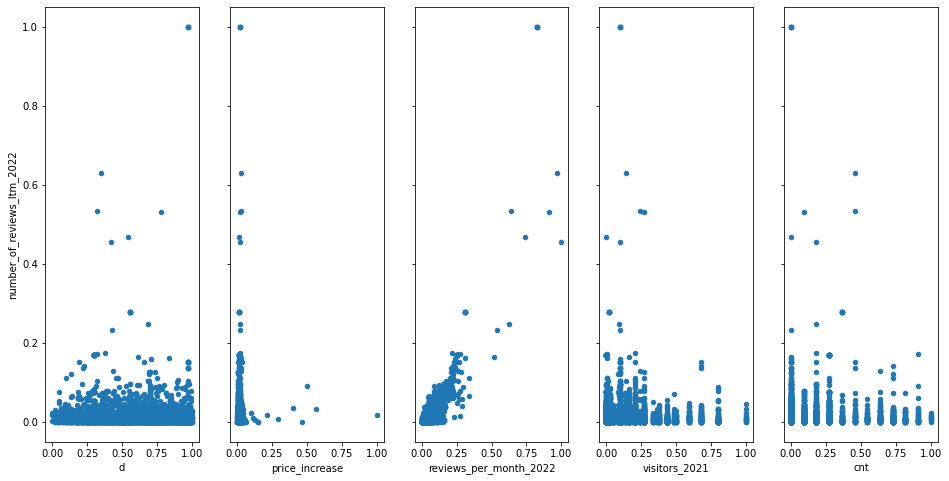

In [58]:
# visualize the relationship between the features and the response using scatterplots

fig, axs = plt.subplots(1, 5, sharey=True)
df_standardised.plot(kind='scatter', x='d', y='number_of_reviews_ltm_2022', ax=axs[0], figsize=(16, 8))
df_standardised.plot(kind='scatter', x='price_increase', y='number_of_reviews_ltm_2022', ax=axs[1])
df_standardised.plot(kind='scatter', x='reviews_per_month_2022', y='number_of_reviews_ltm_2022', ax=axs[2])
df_standardised.plot(kind='scatter', x='visitors_2021', y='number_of_reviews_ltm_2022', ax=axs[3])
df_standardised.plot(kind='scatter', x='cnt', y='number_of_reviews_ltm_2022', ax=axs[4])

In [59]:
# correlation

df_standardised.corr()

,d,price_increase,reviews_per_month_2022,number_of_reviews_ltm_2022,visitors_2021,cnt
d,1.000000,-0.000016,0.007708,0.029141,0.018661,-0.519164
price_increase,-0.000016,1.000000,0.038438,0.032000,-0.007526,0.007847
reviews_per_month_2022,0.007708,0.038438,1.000000,0.845182,-0.037761,-0.003149
number_of_reviews_ltm_2022,0.029141,0.032000,0.845182,1.000000,-0.038807,0.003204
visitors_2021,0.018661,-0.007526,-0.037761,-0.038807,1.000000,0.104551
cnt,-0.519164,0.007847,-0.003149,0.003204,0.104551,1.000000


Text(0.5, 1.0, 'Correlation Matrix')

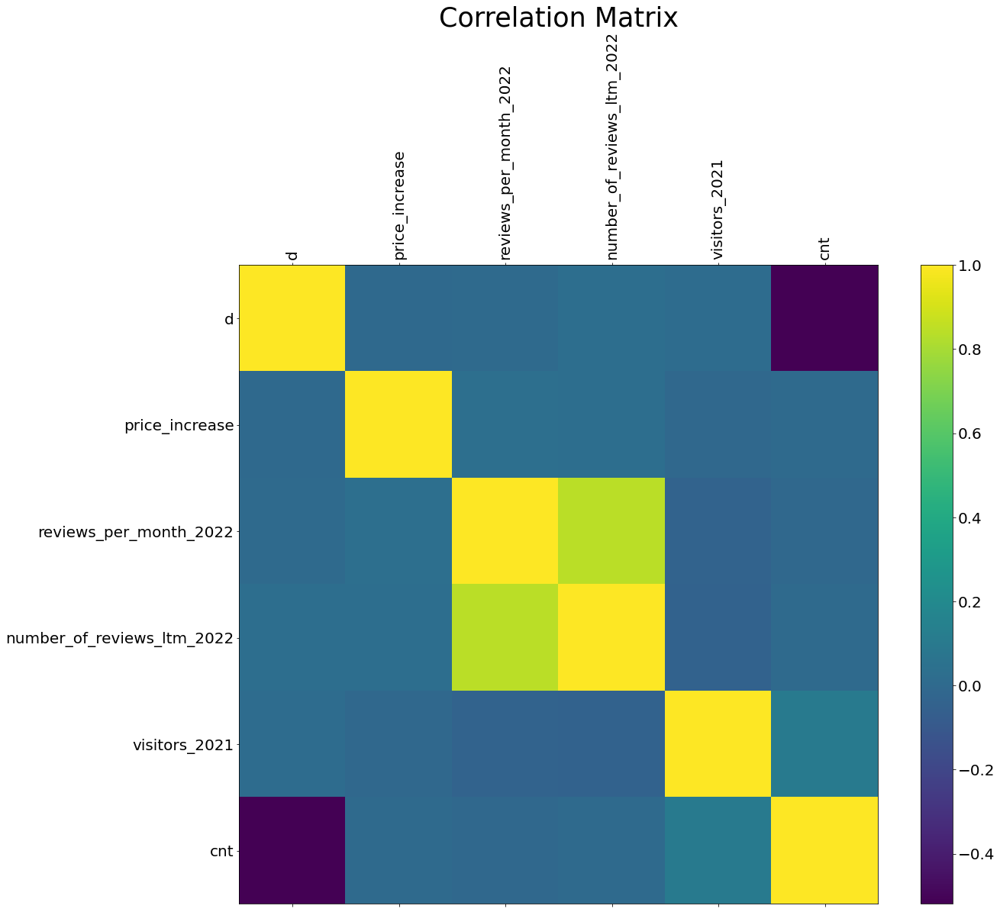

In [60]:
# correlation plot

plt.rcParams["axes.grid"] = False
f = plt.figure(figsize=(20, 15))
plt.matshow(df_final.corr(), fignum=f.number)
plt.xticks(range(df_final.shape[1]), df_final.columns, fontsize=20, rotation=90)
plt.yticks(range(df_final.shape[1]), df_final.columns, fontsize=20)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=20)
plt.title('Correlation Matrix', fontsize=35)

In [61]:
# delete inf and nan

df_standardised[np.isnan(df_final)] = 0
df_standardised[np.isinf(df_final)] = 0

In [62]:
# This performs a multiple regression of expectancy against recycling:

reg_number_of_reviews_ltm_2022 = smf.ols(formula='number_of_reviews_ltm_2022 ~ d + price_increase + reviews_per_month_2022 + visitors_2021 + cnt',data=df_standardised).fit()

# And this gives a big summary of the results:
print(reg_number_of_reviews_ltm_2022.summary())

                                OLS Regression Results                                
Dep. Variable:     number_of_reviews_ltm_2022   R-squared:                       0.715
Model:                                    OLS   Adj. R-squared:                  0.715
Method:                         Least Squares   F-statistic:                     1638.
Date:                        Mon, 30 Jan 2023   Prob (F-statistic):               0.00
Time:                                13:07:29   Log-Likelihood:                 7339.2
No. Observations:                        3265   AIC:                        -1.467e+04
Df Residuals:                            3259   BIC:                        -1.463e+04
Df Model:                                   5                                         
Covariance Type:                    nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

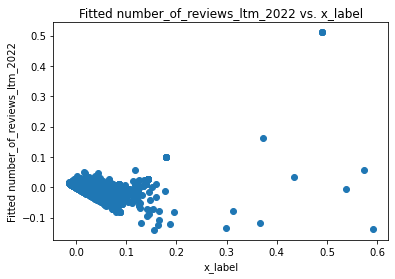

In [63]:
# check whether residuals are independent and homoscedastic

plt.scatter(reg_number_of_reviews_ltm_2022.fittedvalues, reg_number_of_reviews_ltm_2022.resid)

# adding title and labels
plt.xlabel('x_label')
plt.ylabel('Fitted number_of_reviews_ltm_2022')
plt.title('Fitted number_of_reviews_ltm_2022 vs. x_label')
plt.show()

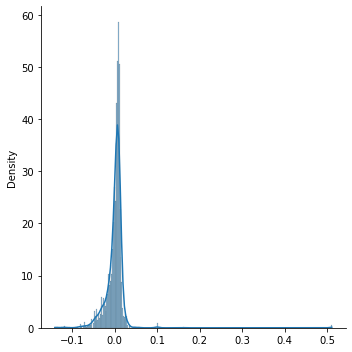

In [64]:
# check whether normal distributed

sn.displot(reg_number_of_reviews_ltm_2022.resid, stat="density", kde = True)

In [65]:
# Data visualisation
# Airbnb reviews in 2022

from folium import plugins

# pick the columns that we need
num = df.shape[0]
lat_cleaned = np.array(df["latitude"][0:num])  # get latitude
lon_cleaned = np.array(df["longitude"][0:num]) # get longitude

# Making the map
london_map = folium.Map(location=[51.507222, -0.1275], 
                     zoom_start=11, 
                     control_scale=True)

cleaned_cluster = plugins.MarkerCluster().add_to(london_map)

for i in range(num):
    folium.Marker(location = [lat_cleaned[i], lon_cleaned[i]]).add_to(cleaned_cluster)

london_map.add_child(cleaned_cluster)

In [66]:
# Data visualisation
# Map of London attractions

# pick the columns that we need
num = df_sites.shape[0]
lat_sites = np.array(df_sites["Latitude"][0:num])  # get latitude
lon_sites = np.array(df_sites["Longitude"][0:num]) # get longitude

# Making the map
london_map_02 = folium.Map(location=[51.507222, -0.1275], 
                     zoom_start=11, 
                     control_scale=True)

sites_cluster = plugins.MarkerCluster().add_to(london_map_02)

for i in range(num):
    folium.Marker(location = [lat_sites[i], lon_sites[i]]).add_to(sites_cluster)

london_map_02.add_child(sites_cluster)

In [34]:
# Data visualisation
# heat map for Airbnb’ historical per month review

from folium.plugins import HeatMap

# pick the columns that we need
airbnbNum = 8252  # number of Airbnb after data cleaning
lat = np.array(df_cleaned["latitude"][0:airbnbNum])  # get latitude
lon = np.array(df_cleaned["longitude"][0:airbnbNum]) # get longitude
pri = np.array(df_cleaned["reviews_per_month_2022"][0:airbnbNum], dtype=float) # price in 2022

# Make the data in the form of [latitude, longitude, price]
Airbnbdata = [[lat[i], lon[i], pri[i]] for i in range(airbnbNum)] 

# Making the map
mapData = folium.Map(location=[51.507222, -0.1275], 
                     zoom_start=11, 
                     control_scale=True)

HeatMap(Airbnbdata).add_to(mapData)

mapData